In [5]:
from keras.models import Model
from keras.layers import Input, Conv3D, concatenate, Conv3DTranspose, LeakyReLU, Dense, Multiply, MaxPooling3D, Lambda, Activation, UpSampling3D, Add, BatchNormalization, Flatten, Dropout
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
import numpy as np
from tensorflow import keras
import random
import keras.backend as K
from keras.models import load_model
from numpy.random import randint
import os
from tensorflow_addons.layers import InstanceNormalization
import elasticdeform
from matplotlib import pyplot as plt
from glob import glob
import tensorflow as tf
from medpy import metric
from scipy.ndimage import _ni_support
from scipy.ndimage.measurements import label, find_objects
from scipy.stats import pearsonr
import sys
np.set_printoptions(threshold=sys.maxsize)
def brightness(X, y):

    X_new = np.zeros(X.shape)
    for c in range(X.shape[-1]):
        im = X[:, :, :, c]
        gain = np.random.uniform(0.8,2.3)
        gamma = np.random.uniform(0.8,2.3)
        im_new = np.sign(im)*gain*(np.abs(im)**gamma)
        X_new[:, :, :, c] = im_new

    return X_new, y

def elastic(X, y, sigma):

    [Xel, yel] = elasticdeform.deform_random_grid(
        [X, y], sigma=np.random.uniform(sigma[0], sigma[1]), axis=[(0, 1, 2), (0, 1, 2),], order=[1, 0], mode='constant')

    return Xel, yel

# def rotation_zoom3D(X, X1, y):
#     """
#     Rotate a 3D image with alfa, beta and gamma degree respect the axis x, y and z respectively.
#     The three angles are chosen randomly between 0-30 degrees
#     """
#     alpha, beta, gamma = np.random.random_sample(3)*np.pi/10
#     Rx = np.array([[1, 0, 0],
#                    [0, np.cos(alpha), -np.sin(alpha)],
#                    [0, np.sin(alpha), np.cos(alpha)]])

#     Ry = np.array([[np.cos(beta), 0, np.sin(beta)],
#                    [0, 1, 0],
#                    [-np.sin(beta), 0, np.cos(beta)]])

#     Rz = np.array([[np.cos(gamma), -np.sin(gamma), 0],
#                    [np.sin(gamma), np.cos(gamma), 0],
#                    [0, 0, 1]])

#     R_rot = np.dot(np.dot(Rx, Ry), Rz)

#     a, b = 0.8, 1.2
#     alpha, beta, gamma = (b-a)*np.random.random_sample(3) + a
#     R_scale = np.array([[alpha, 0, 0],
#                         [0, beta, 0],
#                         [0, 0, gamma]])

#     R = np.dot(R_rot, R_scale)
#     X_rot = np.empty_like(X)
#     X1_rot = np.empty_like(X1)
#     y_rot = np.empty_like(y)
#     for b in range(X.shape[0]):
#         for channel in range(X.shape[-1]):
#             X_rot[b, :, :, :, channel] = affine_transform(
#                 X[b, :, :, :, channel], R, offset=0, order=1, mode='constant')
#     for b in range(X.shape[0]):
#         for channel in range(y.shape[-1]):
#             y_rot[b, :, :, :, channel] = affine_transform(
#                 y[b, :, :, :, channel], R, offset=0, order=0, mode='constant')
            
#     for b in range(X.shape[0]):
#         for channel in range(y.shape[-1]):
#             X1_rot[b, :, :, :, channel] = affine_transform(
#                 X1[b, :, :, :, channel], R, offset=0, order=0, mode='constant')

#     return X_rot, X1_rot, y_rot

def combine_aug(x, y):
    Xnew, ynew = x, y
    # if dec[0] == 1:
    #     Xnew, x1new, ynew = elastic(Xnew, x1new, ynew)

    prob = np.random.randint(0,10)
    prob1 = np.random.randint(0,10)
    
    if prob < 3:
        Xnew, ynew = brightness(Xnew, ynew)

    if prob1 < 3:
        Xnew, ynew = elastic(Xnew, ynew, (10., 13.))
    return Xnew, ynew

def load_img(img_dir, img_list):
    images = []
    for i, image_name in enumerate(img_list):
        if (image_name.split('.')[1] == 'npy'):
            if "image" in image_name:
                image = np.load(img_dir + '/' + image_name)
                # img_dir1 = img_dir.replace("BrainTumorSeg", "BrainTumorSegTemp")
                # image_name1 = image_name.replace(".npy", " (3).npy")
                # image1 = np.load(img_dir1 + '/' + image_name1)
                # image1 = image1.reshape(image.shape[0],image.shape[1],image.shape[2],1)
                # image = np.concatenate((image,image1), axis=3)
                images.append(image[:,:,:,:-1])
            else:
                image = np.load(img_dir + '/' + image_name)
                images.append(image)
            
    # images = np.array(images)
    return(images)

def global_extraction(img, mask):
    img1 = []
    mask1 = []
    for i in range(len(img)):
        img_temp = img[i]
        mask_temp = mask[i]
        or_r = randint(0, img_temp.shape[0]-47)
        or_c = randint(0, img_temp.shape[1]-47)
        img_temp = img_temp[or_r:or_r+48,or_c:or_c+48,:,:]
        mask_temp = mask_temp[or_r:or_r+48,or_c:or_c+48,:,:]
        img1.append(img_temp)
        mask1.append(mask_temp)
    img_final = np.stack((i for i in img1), axis=0)
    mask_final = np.stack((i for i in mask1), axis=0)
    return img_final, mask_final

def imageLoader(img_dir, img_list, mask_dir, mask_list, batch_size):

    # keras needs the generator infinite, so we will use while true
    while True:

        batch_start = 0
        batch_end = batch_size

        temp1 = list(zip(img_list, mask_list))
        random.shuffle(temp1)
        img_list, mask_list = zip(*temp1)
        img_list, mask_list = list(img_list), list(mask_list)

        L = len(img_list)

        while batch_start < L:
            limit = min(batch_end, L)

            X = load_img(img_dir, img_list[batch_start:limit])
            Y = load_img(mask_dir, mask_list[batch_start:limit])
            X,Y = global_extraction(X,Y)
            temp = np.zeros(2)
            
            region_based = np.zeros((batch_size, 48, 48, 128, 1))
            
            region_based = model_whole.predict(X[:,:,:,:,:])
            
            X = np.concatenate((X, region_based), axis = -1)

            combine_aug(X, Y)
            
            batch_start += batch_size
            batch_end += batch_size

            yield (X, Y)  # a tuple with two numpy arrays with batch_size samples

def imageLoader_val(img_dir, img_list, mask_dir, mask_list, batch_size1):

    L = len(img_list)

    #keras needs the generator infinite, so we will use while true  
    while True:

        batch_start = 0
        batch_end = batch_size1

        while batch_start < L:
            limit = min(batch_end, L)

            X = load_img(img_dir, img_list[batch_start:limit])
            Y = load_img(mask_dir, mask_list[batch_start:limit])
            X,Y = global_extraction(X,Y)
            
            region_based = np.zeros((batch_size, 48, 48, 128, 1))
            
            region_based = model_whole.predict(X[:,:,:,:,:])
            
            X = np.concatenate((X, region_based), axis = -1)
            
            batch_start += batch_size
            batch_end += batch_size

            yield (X, Y)  # a tuple with two numpy arrays with batch_size samples

# def dice_coef(y_true, y_pred, smooth=1):
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
#     if K.sum(y_true_f) == 0.0:
#         if K.sum(y_pred_f) == 0.0:
#             return 1.0
#         else: 
#             return 0.0
#     else:
#         intersection = K.sum(y_true_f * y_pred_f)
#         return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def weighted_dice_loss(y_true, y_pred):
    return (1-dice_coef_multilabel(y_true, y_pred))  # taking average
    
def dice_coef_multilabel(y_true, y_pred, numLabels=3):
    dice = 0
    for index in range(numLabels):
        dice += dice_coef(y_true[:, :, :, :, index+1], y_pred[:,:, :, :, index+1])
    return dice/numLabels  # taking average

def double_conv_block(x, n_filters):
    x1 = InstanceNormalization()(x)
    x1 = Conv3D(n_filters, 3, padding="same", activation=leaky_relu)(x1)
    x2 = InstanceNormalization()(x1)
    x2 = Conv3D(n_filters, 3, padding="same", activation=leaky_relu)(x2)
    return x2

def core_tumor(y_true, y_pred):
    return dice_coef(y_true[:, :, :, :, 1], y_pred[:, :, :, :, 1])
    # core tumor

def peritumoral_edema(y_true, y_pred):
    return dice_coef(y_true[:,:, :, :, 2], y_pred[:,:, :, :, 2])
    # peritumoral edema

def enhancing_tumor(y_true, y_pred):
    return dice_coef(y_true[:,:, :, :, 3], y_pred[:,:, :, :, 3])
    # GD-enhancing tumor

def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    smooth = 0.000001
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)
####################################################

train_img_dir = r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\train\images"
train_mask_dir = r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\train\masks"

val_img_dir = r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images"
val_mask_dir = r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks"

train_img_list = os.listdir(train_img_dir)
train_mask_list = os.listdir(train_mask_dir)

val_img_list = os.listdir(val_img_dir)
val_mask_list = os.listdir(val_mask_dir)

################################################################

batch_size = 8
#Change global extraction also

train_img_datagen = imageLoader(train_img_dir, train_img_list,
                                train_mask_dir, train_mask_list, batch_size)

val_img_datagen = imageLoader_val(val_img_dir, val_img_list,
                              val_mask_dir, val_mask_list, batch_size)

###############################################################
#LR = 0.0003
LR = 0.000
optim = keras.optimizers.Adam(LR)

def lr_time_decay(epoch, lr):
    return lr * (1 - (epoch/300))**0.9

################################################################

Metrics = [dice_coef_multilabel, core_tumor, peritumoral_edema, enhancing_tumor]

steps_per_epoch = len(train_img_list)//batch_size
val_steps_per_epoch = len(val_img_list)//batch_size

################################################################
leaky_relu = LeakyReLU(alpha=0.05)
# Try decreasing

n_channels = 32

def simple_unet_model(num_shape, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, num_classes):
    # Build the model

    if num_classes > 1:
        function = 'softmax'
    else:
        function = 'sigmoid'

    input_global = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, num_shape))

    #Contraction path
    c2 = double_conv_block(input_global, n_channels*2)
    p2 = Conv3D(n_channels*2, 3, padding="same", activation=leaky_relu, strides = (2,2,2))(c2)

    c3 = double_conv_block(p2, n_channels*4)
    p3 = Conv3D(n_channels*4, 3, padding="same", activation=leaky_relu, strides = (2,2,2))(c3)

    c4 = double_conv_block(p3, n_channels*8)
    p4 = Conv3D(n_channels*8, 3, padding="same", activation=leaky_relu, strides = (2,2,2))(c4)

    c5 = double_conv_block(p4, n_channels*10)

    #Expansive path
    u6 = Conv3DTranspose(n_channels*8, (2, 2, 2), strides=(2, 2, 2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    c6 = double_conv_block(u6, n_channels*8)

    u7 = Conv3DTranspose(n_channels*4, (2, 2, 2), strides=(2, 2, 2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    c7 = double_conv_block(u7, n_channels*4)

    u8 = Conv3DTranspose(n_channels*2, (2, 2, 2), strides=(2, 2, 2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    c8 = double_conv_block(u8, n_channels*2)

    # o1 = Conv3D(1, (1, 1, 1), activation='sigmoid')(c9)
    # o2 = Conv3D(1, (1, 1, 1), activation='sigmoid')(c9)
    # o3 = Conv3D(1, (1, 1, 1), activation='sigmoid')(c9)l
    # o4 = Conv3D(1, (1, 1, 1), activation='sigmoid')(c9)

    # outputs = concatenate([o1,o2,o3,o4])

    #Uncertainty
    outputs = Conv3D(num_classes, (1, 1, 1), activation=function)(c8)
    # Test unpadded convolution and strided convolution
    # Try using sigmoid (research papers)
    model = Model(inputs=[input_global], outputs=[outputs])
    # model.summary()
    return model

# Test if everything is working ok.
model_whole = simple_unet_model(4, 48, 48, 128, 1)
model = simple_unet_model(5, 48, 48, 128, 4)

model_whole.load_weights(r'C:\Users\kesch\OneDrive\Documents\Deeplearning\seg_weights\whole.hdf5')
class MyThresholdCallback(tf.keras.callbacks.Callback):
    def __init__(self, threshold):
        super(MyThresholdCallback, self).__init__()
        self.threshold = threshold

    def on_epoch_end(self, epoch, logs=None): 
        val_acc = logs["val_dice_coef_multilabel"]
        if val_acc >= self.threshold:
            self.model.stop_training = True
#Total Loss
model.compile(optimizer=optim, loss=weighted_dice_loss, metrics=Metrics)
my_callback = MyThresholdCallback(threshold=0.88)
checkpoint_path = r'C:\Users\kesch\OneDrive\Documents\Deeplearning\seg_weights\combined.hdf5'
callback = ModelCheckpoint(filepath=checkpoint_path,
                           save_weights_only=True, verbose=1)
model.load_weights(r'C:\Users\kesch\OneDrive\Documents\Deeplearning\seg_weights\combined.hdf5')

#combined is the value of 88

# history = model.fit(train_img_datagen,
#                     steps_per_epoch=steps_per_epoch,
#                     epochs=1000,
#                     verbose=1,
#                     validation_data=val_img_datagen,
#                     validation_steps=val_steps_per_epoch,
#                     callbacks=[callback,my_callback],
#                     )


# , LearningRateScheduler(lr_time_decay, verbose = 1)

##############################################################################################
# img = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_120.npy")[..., :-1]
# msk = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks\mask_120.npy")

def put_together(img, msk,slide):

    img  = np.expand_dims(img, axis=0)
    msk  = np.expand_dims(msk, axis=0)

    a = 0
    b = 48
    c = 0
    d = 48

    img_final = np.zeros(img.shape)
    uncertainty = np.zeros((img.shape[0], img.shape[1], img.shape[2], img.shape[3]))
    for i in range((img.shape[2]//48)+1):
        a = 0
        b = 48
        for j in range((img.shape[1]//48)+1):
            imgtemp = img[:,a:b, c:d, :, :]
            uncertainty[:,a:b, c:d, :] = uncert(imgtemp,slide)
            region_based = model_whole.predict(imgtemp)
            imgtemp = np.concatenate((imgtemp, region_based), axis = -1)
            test_prediction = model.predict([imgtemp])
            img_final[:,a:b, c:d, :, :] = test_prediction
            if b+48 < img.shape[1]:
                a+=48
                b+=48
            else:
                b = img.shape[1]
                a = b-48
        if d+48 < img.shape[2]:
            c+=48
            d+=48
        else:
            d = img.shape[2]
            c = d-48

    img_final = np.argmax(img_final, axis=4)
    msk = np.argmax(msk, axis=4)
    return img_final, msk, uncertainty

def uncert(img,slide):
    #given img shape is 1, 48, 48, 128, 4
    region_based = model_whole.predict(img)
    img8 = np.concatenate((img, region_based), axis = -1)
    test_prediction8 = model.predict([img8])

    img1 = np.flip(img,axis=1)
    region_based1 = model_whole.predict(img1)
    img1 = np.concatenate((img1, region_based1), axis = -1)
    test_prediction1 = model.predict([img1])
    test_prediction1 = np.flip(test_prediction1,axis=(1))
   
    img2 = np.flip(img,axis=2)
    region_based2 = model_whole.predict(img2)
    img2 = np.concatenate((img2, region_based2), axis = -1)
    test_prediction2 = model.predict([img2])
    test_prediction2 = np.flip(test_prediction2,axis=(2))
   
    img3 = np.flip(img,axis=3)
    region_based3 = model_whole.predict(img3)
    img3 = np.concatenate((img3, region_based3), axis = -1)
    test_prediction3 = model.predict([img3])
    test_prediction3 = np.flip(test_prediction3,axis=(3))
   
    img4 = np.flip(img,axis=(1,2))
    region_based4 = model_whole.predict(img4)
    img4 = np.concatenate((img4, region_based4), axis = -1)
    test_prediction4 = model.predict([img4])
    test_prediction4 = np.flip(test_prediction4,axis=(1,2))
   
    img5 = np.flip(img,axis=(2,3))
    region_based5 = model_whole.predict(img5)
    img5 = np.concatenate((img5, region_based5), axis = -1)
    test_prediction5 = model.predict([img5])
    test_prediction5 = np.flip(test_prediction5,axis=(2,3))
   
    img6 = np.flip(img,axis=(3,1))
    region_based6 = model_whole.predict(img6)
    img6 = np.concatenate((img6, region_based6), axis = -1)
    test_prediction6 = model.predict([img6])
    test_prediction6 = np.flip(test_prediction6,axis=(1,3))
   
    img7 = np.flip(img,axis=(1,2,3))
    region_based7 = model_whole.predict(img7)
    img7 = np.concatenate((img7, region_based7), axis = -1)
    test_prediction7 = model.predict([img7])
    test_prediction7 = np.flip(test_prediction7,axis=(1,2,3))

    test_prediction = (test_prediction8 + test_prediction1 + test_prediction2 + test_prediction3 + test_prediction4 + test_prediction5 + test_prediction6 + test_prediction7)/8
    confidence = np.zeros((1,48,48,128))
    # for k in range(128):
    for k in range(slide,slide+1):
        for j in range(48):
            for l in range(48):
                confidence[:,l,j,k] = tf.math.reduce_logsumexp(-1*(test_prediction[0,l,j,k]))
    return confidence

slide = 50

In [3]:
# for i in range(128):
#     print(np.sum(confidence1[0,:,:,i]))
#     print(i)



img_orig = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_120.npy")[..., :-1]
msk = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks\mask_120.npy")

img_pred, msk, confidence = put_together(img_orig,msk,slide)

pred = np.zeros((128,128,128))
truth = np.zeros((128,128,128))
uncertainty = np.full((128,128,128), fill_value=confidence[0,0,0,slide])


pred[42:128,:91,:] = img_pred
truth[42:128,:91,:] = msk
uncertainty[42:128,:91,:] = confidence

img_orig = np.expand_dims(img_orig, axis=0)

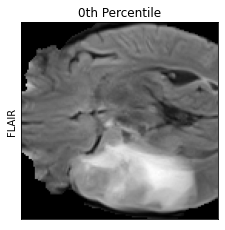

In [7]:
img = np.expand_dims(np.load(r"C:\Users\kesch\OneDrive\Desktop\BratsSegBinary\val\images\image_239.npy"), axis = 0)
for i in range(slide,slide+1):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(236)
    plt.title('0th Percentile')
    plt.ylabel("FLAIR")
    plt.imshow(img[0,:, :, n_slice,0],cmap = "gray")
    plt.gca().set_yticklabels([])
    plt.gca().set_xticklabels([])
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.grid(False)
    plt.show()

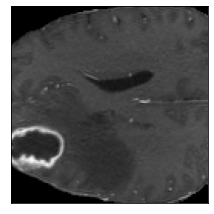

In [6]:
img = np.expand_dims(np.load(r"C:\Users\kesch\OneDrive\Desktop\BratsSegBinary\train\images\image_120.npy"), axis = 0)
for i in range(slide,slide+1):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(236)
    plt.imshow(img[0,:, :, n_slice,1],cmap = "gray")
    plt.grid(False)
    plt.gca().set_yticklabels([])
    plt.gca().set_xticklabels([])
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.show()

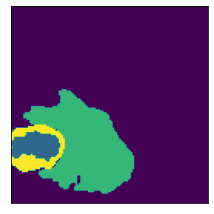

In [9]:
for i in range(slide,slide+1):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(236)
    plt.imshow(pred[:, :, n_slice])
    plt.grid(False)
    plt.gca().set_yticklabels([])
    plt.gca().set_xticklabels([])
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.show()

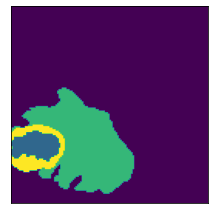

In [10]:
for i in range(slide,slide+1):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(235)
    plt.imshow(truth[:, :, n_slice])
    plt.grid(False)
    plt.gca().set_yticklabels([])
    plt.gca().set_xticklabels([])
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.show()

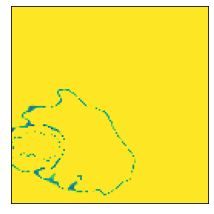

In [11]:
for i in range(slide,slide+1):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(234)
    plt.imshow(uncertainty[:, :, n_slice])
    plt.grid(False)
    plt.gca().set_yticklabels([])
    plt.gca().set_xticklabels([])
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.show()

In [12]:

img_orig = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_253.npy")[..., :-1]
msk = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks\mask_253.npy")
#50th percentile
img_pred, msk, confidence = put_together(img_orig,msk,80)

img_orig1 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_33.npy")[..., :-1]
msk1 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks\mask_33.npy")

img_pred1, msk1, confidence1 = put_together(img_orig1,msk1,50)

img_orig2 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_21.npy")[..., :-1]
msk2 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks\mask_21.npy")

img_pred2, msk2, confidence2 = put_together(img_orig2,msk2,50)

img_orig3 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_41.npy")[..., :-1]
msk3 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks\mask_41.npy")

img_pred3, msk3, confidence3 = put_together(img_orig3,msk3,50)

img_orig4 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_120.npy")[..., :-1]
msk4 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\masks\mask_120.npy")

img_pred4, msk4, confidence4 = put_together(img_orig4,msk4,50)


img_orig = np.expand_dims(img_orig, axis=0)
img_orig1 = np.expand_dims(img_orig1, axis=0)
img_orig2 = np.expand_dims(img_orig2, axis=0)
img_orig3 = np.expand_dims(img_orig3, axis=0)
img_orig4 = np.expand_dims(img_orig4, axis=0)

KeyboardInterrupt: 

In [10]:
# img_orig1 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_33.npy")[..., :-1]
# img_orig2 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_21.npy")[..., :-1]
# img_orig3 = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\val\images\image_41.npy")[..., :-1]


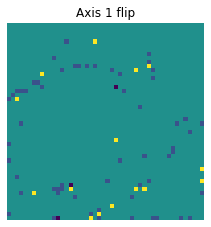

In [19]:
new = np.zeros((1,48,48,128))
for k in range(50,51):
    for j in range(48):
        for l in range(48):
            new[:,l,j,k] = (np.sum(test_prediction[0,l,j,k]))/4

for i in range(50,51):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(231)
    plt.title('Axis 1 flip')
    plt.imshow(new[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.show()

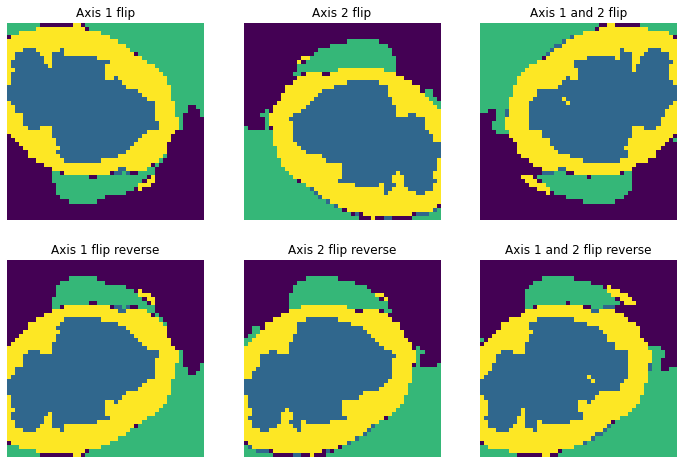

In [9]:

# for i in range(128):
#     print(np.sum(confidence[0,:,:,i]))
#     print(i)

#MODIFIED
##################################################################################################
img = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\train\images\image_155.npy")[..., :-1]
msk = np.load(r"C:\Users\kesch\OneDrive\Desktop\BrainTumorSeg\train\masks\mask_155.npy")

img = np.expand_dims(img, axis=0)
msk = np.expand_dims(msk, axis=0)

img, msk = global_extraction(img, msk)

img1 = np.flip(img,axis=(1))
img2= np.flip(img,axis=(2))
img3 = np.flip(img,axis=(1,2))
region_based1 = model_whole.predict(img1)
region_based2 = model_whole.predict(img2)
region_based3 = model_whole.predict(img3)

img1 = np.concatenate((img1, region_based1), axis = -1)
img2 = np.concatenate((img2, region_based2), axis = -1)
img3 = np.concatenate((img3, region_based3), axis = -1)

test_prediction1 = model.predict([img1])
test_prediction2 = model.predict([img2])
test_prediction3 = model.predict([img3])

test_prediction_post_1 = np.flip(test_prediction1,axis=(1))
test_prediction_post_2 = np.flip(test_prediction2,axis=(2))
test_prediction_post_3 = np.flip(test_prediction3,axis=(1,2))

test_prediction = (test_prediction_post_1 + test_prediction_post_2 + test_prediction_post_3)/3

confidence = np.zeros((1,48,48,128))
for k in range(50,51):
    for j in range(48):
        for l in range(48):
            confidence[:,l,j,k] = tf.math.reduce_logsumexp(-1*(test_prediction[0,l,j,k]))
            test_prediction[:,l,j,k] = np.mean(test_prediction[0,l,j,k])


test_prediction_post_1 = np.argmax(np.flip(test_prediction1,axis=(1)), axis=-1)
test_prediction_post_2 = np.argmax(np.flip(test_prediction2,axis=(2)), axis=-1)
test_prediction_post_3 = np.argmax(np.flip(test_prediction3,axis=(1,2)), axis=-1)

test_prediction1 = np.argmax(test_prediction1, axis = -1)
test_prediction2 = np.argmax(test_prediction2, axis = -1)
test_prediction3 = np.argmax(test_prediction3, axis = -1)


for i in range(50,51):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(231)
    plt.title('Axis 1 flip')
    plt.imshow(test_prediction1[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(232)
    plt.title('Axis 2 flip')
    plt.imshow(test_prediction2[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(233)
    plt.title('Axis 1 and 2 flip')
    plt.imshow(test_prediction3[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(234)
    plt.title('Axis 1 flip reverse')
    plt.imshow(test_prediction_post_1[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(235)
    plt.title('Axis 2 flip reverse')
    plt.imshow(test_prediction_post_2[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(236)
    plt.title('Axis 1 and 2 flip reverse')
    plt.imshow(test_prediction_post_3[0,:, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.show()    

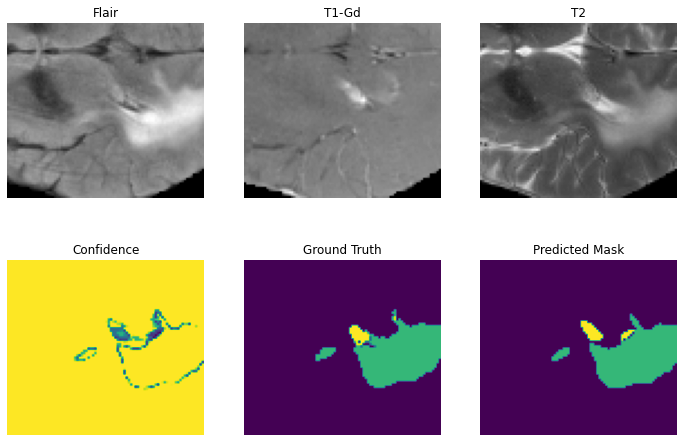

In [11]:

# for i in range(128):
#     print(np.sum(confidence2[0,:,:,i]))
#     print(i)
for i in range(50,51):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(231)
    plt.title('Flair')
    plt.imshow(img_orig[0, :, :, n_slice,0], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(232)
    plt.title('T1-Gd')
    plt.imshow(img_orig[0, :, :, n_slice,1], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(233)
    plt.title('T2')
    plt.imshow(img_orig[0, :, :, n_slice,3], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(234)
    plt.title('Confidence')
    plt.imshow(confidence[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(235)
    plt.title('Ground Truth')
    plt.imshow(msk[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(236)
    plt.title('Predicted Mask')
    plt.imshow(img_pred[0,:, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.show()    

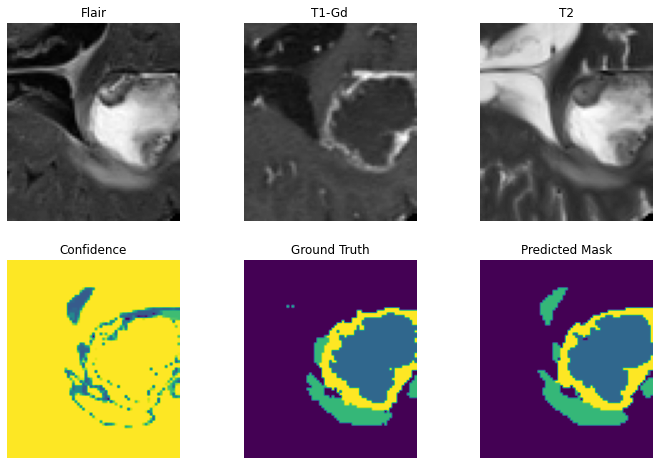

In [15]:

# for i in range(128):
#     print(np.sum(confidence3[0,:,:,i]))
#     print(i)
for i in range(71,72):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(231)
    plt.title('Flair')
    plt.imshow(img_orig3[0, :, :, n_slice,0], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(232)
    plt.title('T1-Gd')
    plt.imshow(img_orig3[0, :, :, n_slice,1], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(233)
    plt.title('T2')
    plt.imshow(img_orig3[0, :, :, n_slice,3], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(234)
    plt.title('Confidence')
    plt.imshow(confidence3[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(235)
    plt.title('Ground Truth')
    plt.imshow(msk3[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(236)
    plt.title('Predicted Mask')
    plt.imshow(img_pred3[0,:, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.show()    

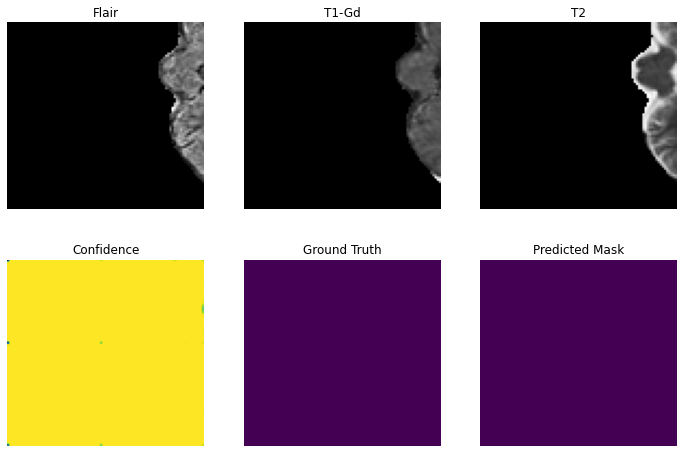

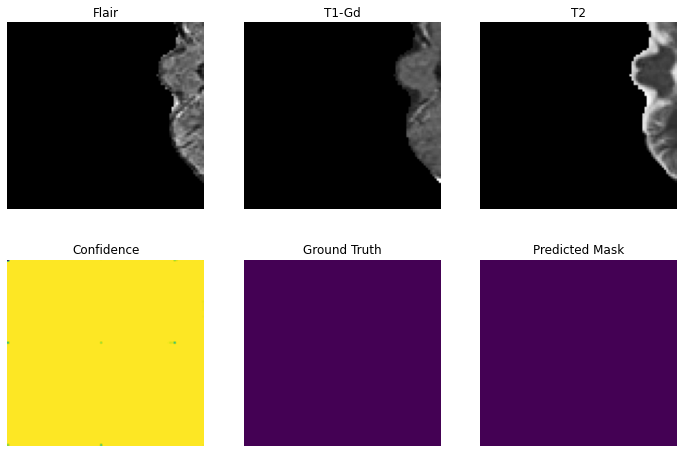

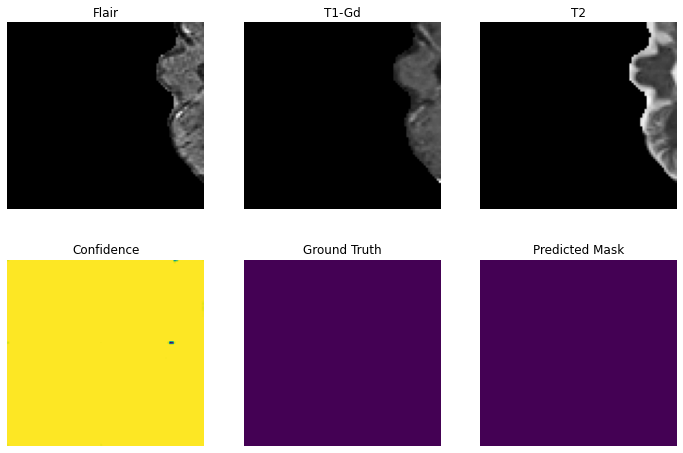

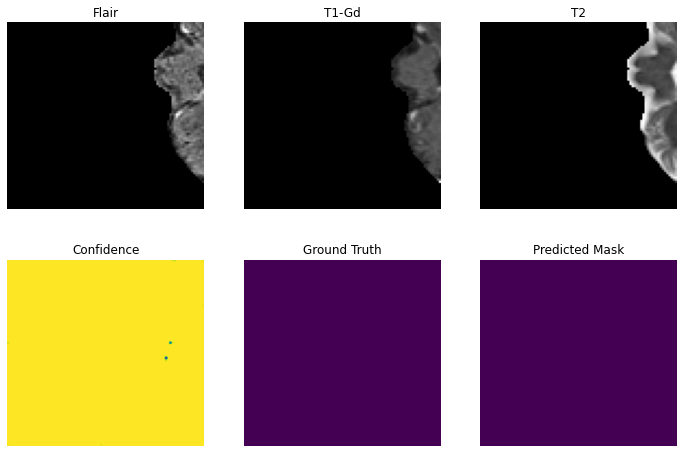

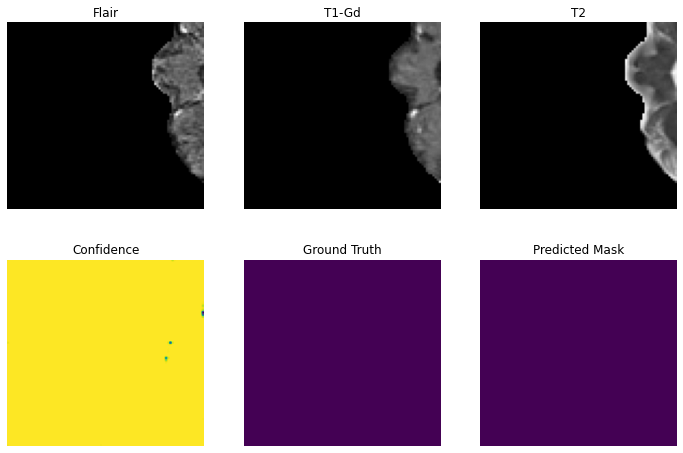

...

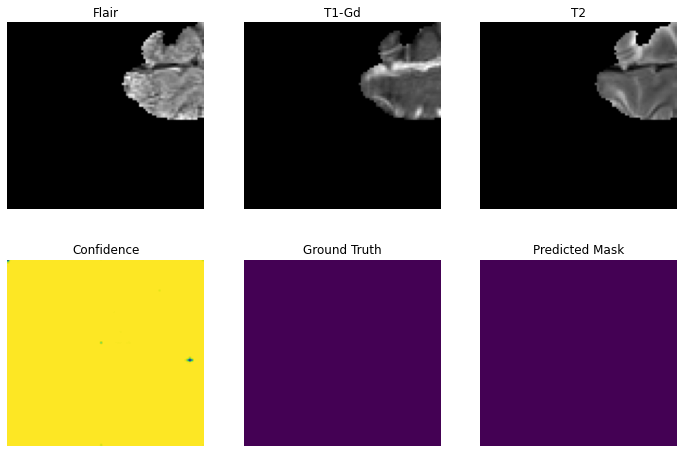

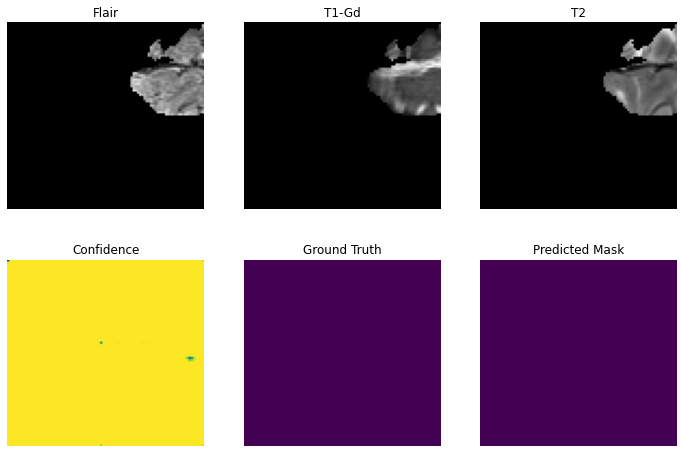

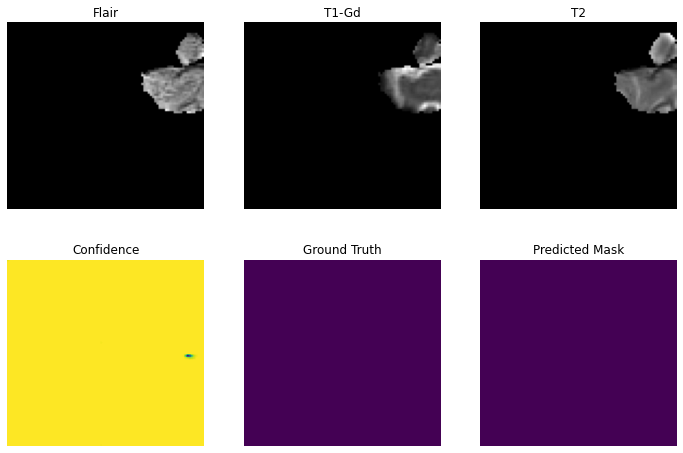

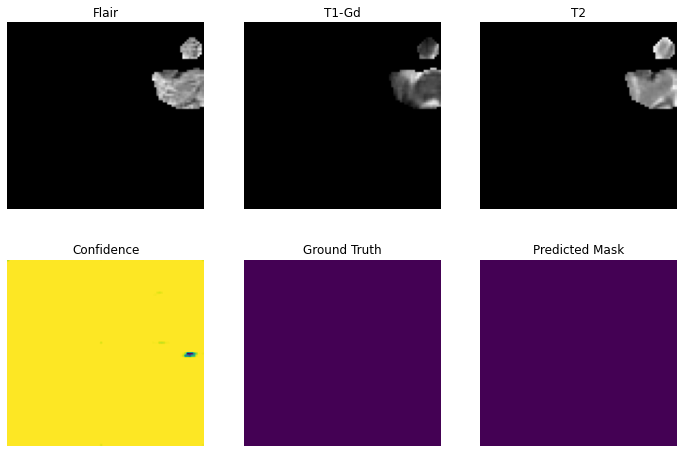

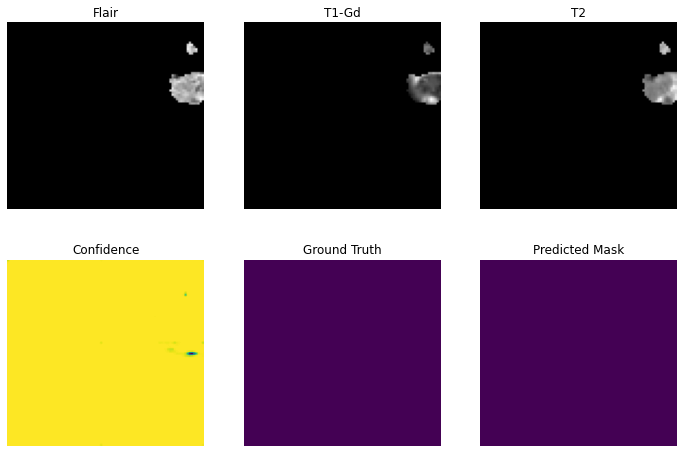

In [18]:

# for i in range(128):
#     print(np.sum(confidence4[0,:,:,i]))
#     print(i)
for i in range(128):
    n_slice = i
    plt.figure(figsize=(12, 8))
    plt.subplot(231)
    plt.title('Flair')
    plt.imshow(img_orig4[0, :, :, n_slice,0], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(232)
    plt.title('T1-Gd')
    plt.imshow(img_orig4[0, :, :, n_slice,1], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(233)
    plt.title('T2')
    plt.imshow(img_orig4[0, :, :, n_slice,3], cmap='gray')
    plt.grid(False)
    plt.axis('off')
    plt.subplot(234)
    plt.title('Confidence')
    plt.imshow(confidence4[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(235)
    plt.title('Ground Truth')
    plt.imshow(msk4[0, :, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.subplot(236)
    plt.title('Predicted Mask')
    plt.imshow(img_pred4[0,:, :, n_slice])
    plt.grid(False)
    plt.axis('off')
    plt.show()    